<div style="font-size:30pt; line-height:25pt; font-weight:bold; text-align:center;">Neural Style Transfer (NST)</div>

<div class="alert alert-warning">

This notebook covers the topic of Neural Style Transfer. It is accompanied by useful functions for the execution of the notebook (in the file **useful_functions.py**) but unnecessary in detail for understanding the subject; and the pre-trained and adapted Vgg19 model (in the file **models/definitions/vgg19.py**), which we will refer to in this notebook. We encourage you to open this file to take a look at the commented code of this model, although it will be extensively explained and illustrated in this notebook.


<div class='alert alert-primary'>

## Installation 

In case you did not read the README.md, follow the next commands:

To set up the environment, use the following command:
```sh
conda env create -f environment.yml
```
Then, activate the environment:
```sh
conda activate NST_env
```
Once the environment is set up, open the desired Jupyter Notebook:
- For the English version: `NST_eng.ipynb`
- For the French version: `NST_fr.ipynb`

Follow the instructions in the notebook to apply Neural Style Transfer and explore the results.

Enjoy!

<div style="text-align: center;">
    <img src="illustrations/gif.gif" alt="Animation d'illustration" />
</div>


### Import

In [7]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import torch
from torchvision import transforms
from torch.autograd import Variable
from torch.optim import LBFGS
import os
from models.definitions.vgg19 import Vgg19
from models.definitions.vgg19_average_pooling import VGG_avg_pool

import useful_functions
from useful_functions import display_images_side_by_side, save_and_maybe_display, generate_difference_heatmap, show_heatmap, display_generated_image, create_gif_from_images, display_gif, select_files, display_five_images

### Definitions of the directories where the images are stored


In [8]:
PATH = './'
default_resource_dir = os.path.join(PATH, 'data')
content_images_dir = os.path.join(default_resource_dir, 'content-images')
style_images_dir = os.path.join(default_resource_dir, 'style-images')
output_img_dir = os.path.join(default_resource_dir, 'output-images')
img_format = (4, '.jpg')

# Global introduction

<div class="alert alert-warning">

The following paragraphs aim to give you a first overview of the objective of **Neural Style Transfer** and how it works. The different sections of the notebook will go into more detail about the theory and the functioning of each step, along with commented code.


Neural Style Transfer (NST) is a **deep learning technique** that allows merging the content of one image (the *content image* in our case) with the style of another (the *style image*). It relies on the use of convolutional neural networks (CNNs), such as the VGG-19 model that we will use, to extract and recombine the features of both content and style images. The goal is to **generate a new image that retains the structure of the content image while adopting the textures and patterns of the style image**.  

<center><img src="illustrations/example1.png"></center>


NST relies on several key steps. First, the images are preprocessed (1): they are loaded, resized, and normalized to meet the model's expectations. Then, a pre-trained model (2), specifically **VGG-19**, is used to extract different representations of the images. This model is not trained but simply used as a feature extractor.

NST needs to represent both the content of the *content image* and the style of the *style image*. A **specific layer of the network is chosen to capture the main structure and shapes of the content image**. In parallel, the style of the image is extracted using the Gram matrix (3), which captures the correlations between different filter activations in the network. This matrix represents the textures and patterns characteristic of the image's style.

Once these representations are obtained, a loss function is defined to guide the optimization. This function consists of three main components (4): the **content loss**, which measures the difference between the generated image and the content image; the **style loss**, which evaluates the similarity between the Gram matrices of the generated image and those of the style image; and finally, the **total variation loss**, which encourages pixel continuity to avoid artifacts and noise.

The generated image is initialized from the content image and then optimized by an algorithm such as **L-BFGS**, which gradually adjusts its pixels to minimize the loss function. This optimization is performed over several iterations, during which the image gradually evolves to integrate the style of the reference image while preserving the structure of the original image (5).

<div class="alert alert-success">

In this notebook, we will follow these different steps:
**

1. **Image preprocessing (loading, normalization, conversion to the expected format).**
2. **Building the VGG-19 model to extract content and style features.**
3. **Extracting style representations from the network.**
4. **Defining the losses (content, style, variation).**
5. **Final implementation and results**
6. **Discussions and comparisons**

Let this notebook guide you, and you will become a Neural Style Transfer expert!

</div>


<div class="alert alert-warning">

**TIPS**: The generation of the final image may take several minutes (depending on your device). We recommend starting it now so that the generation happens while you browse through the notebook. To do so, please follow the instructions below:

Enter the names of the "content" and "style" images you want to use for the NST in the code block below. Make sure the images are stored in the following directories:  
🔹 in the **"content-images"** directory for the content image  
🔹 in the **"style-images"** directory for the style image  

You can choose any combination from the already available images in the two directories, or import your own images (the latter is highly recommended to fully engage with this notebook!). Examples using images from the folders will be provided at the end of the notebook.

Run the notebook (at least up to the end of the section *"**5. Final Implementation and Results**"*, or **press "Run all" if you prefer**).
Check that the calculation starts and that lines similar to the following appear just after the code line *results_path = neural_style_transfer(optimization_config)* in section 5 :

![alt text](illustrations/terminal.png)


In [ ]:
CONTENT_IMAGE = 'berlin.jpg'  # EDIT ME NOW !!
STYLE_IMAGE = 'van_gogh.jpg'   # EDIT ME NOW !!
MODEL = Vgg19(requires_grad=False, show_progress=True)   # EDIT LATER with VGG_avg_pool(requires_grad=False, show_progress=True)
NUM_ITERATIONS = 500   #EDIT ME LATER

You can now run the notebook while letting your calculation run in the background!


# 1. Image Preprocessing


This section is a preliminary step focused on image preprocessing. As a reminder, the model we will base the subsequent processes on for NST is a **VGG-type neural network**. These networks were trained on large datasets like ImageNet, where the **image pixels are normalized to have specific means and standard deviations**.  
For example, the colors of the images are centered around the *IMAGENET_MEAN_255* and standardized. This is why we define the following two global variables, which are essential for our preprocessing.


In [10]:
IMAGENET_MEAN_255 = [123.675, 116.28, 103.53]  # RGB canals means 
IMAGENET_STD_NEUTRAL = [1, 1, 1]  # neutral stdev values

<div class="alert alert-info">

We apply the same normalization to the images as the one used in the VGG training data, for two main reasons:  
🔹 **Maintain consistency with the network's training**: this ensures that the network correctly interprets the image features.  
🔹 Preserve activation stability: this avoids discrepancies in the activations of the internal layers, which is crucial for precise content and style calculations.


In [11]:
def load_image(img_path, target_shape="None"):
    '''
    Loads an image from a given path.
    Resizes the image according to the target size.
    Returns the image ready for further processing.
    '''
    if not os.path.exists(img_path):
        raise Exception(f'Path not found: {img_path}')
    img = cv.imread(img_path)[:, :, ::-1]                   # converts BGR to RGB 
    if target_shape is not None:
        if isinstance(target_shape, int) and target_shape != -1:
            current_height, current_width = img.shape[:2]
            new_height = target_shape
            new_width = int(current_width * (new_height / current_height))
            img = cv.resize(img, (new_width, new_height), interpolation=cv.INTER_CUBIC)
        else:
            img = cv.resize(img, (target_shape[1], target_shape[0]), interpolation=cv.INTER_CUBIC)
    img = img.astype(np.float32)
    img /= 255.0
    return img

def prepare_img(img_path, target_shape, device):
    '''
    Transforms the image into a PyTorch tensor.
    '''
    img = load_image(img_path, target_shape=target_shape)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255)),
        transforms.Normalize(mean=IMAGENET_MEAN_255, std=IMAGENET_STD_NEUTRAL)])
    img = transform(img).to(device).unsqueeze(0)
    return img

def save_image(img, img_path):
    ''' 
    Saves the image to the specified location.
    '''
    if len(img.shape) == 2:
        img = np.stack((img,) * 3, axis=-1)
        
    cv.imwrite(img_path, img[:, :, ::-1])  


Let's apply this preprocessing to your image:


[ WARN:0@2339.152] global loadsave.cpp:848 imwrite_ Unsupported depth image for selected encoder is fallbacked to CV_8U.


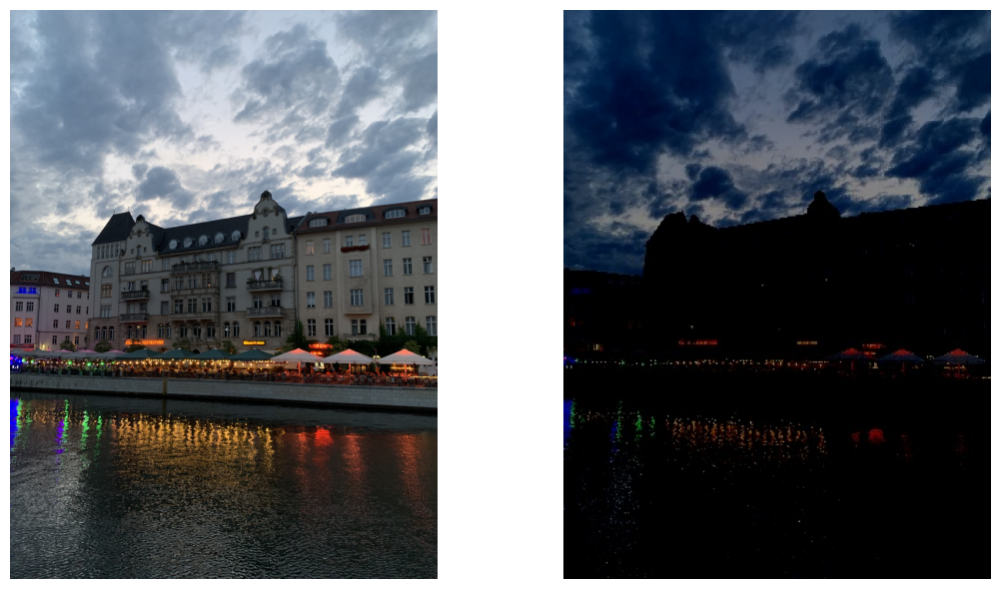

In [12]:
path_img = os.path.join(".", "data", "content-images", CONTENT_IMAGE)
path_save = os.path.join(".", "data", "treated-images", CONTENT_IMAGE)
img = prepare_img(path_img, 400, 'cpu')
img_numpy = img.squeeze(0).permute(1, 2, 0).cpu().numpy()
save_image(img_numpy, path_save)
display_images_side_by_side(path_img, path_save)

🔹 The image has been resized while maintaining its proportions.  
🔹 The colors of the image have been significantly altered. This is due to the normalization steps mentioned earlier.

<div class="alert alert-info">

**But isn't it problematic that our original photo is so altered in terms of colors?**

Not at all! In NST, we don't directly use the colors or raw pixels. Instead, we work with the activations of the network's convolutional layers:

🔹 These activations extract abstract feature maps, which capture patterns or textures.  
🔹 As a result, they are less sensitive to individual color variations.

So, even though the normalization changes the colors, this does not affect NST, because:

🔹 The calculations are based on abstract representations, such as filter correlations (via the Gram matrix for style) or deep layer activations (for content).

No worries! The function *save_and_maybe_display* (in useful_functions.py) denormalizes the image before saving and displaying it. This normalization process is thus hidden from the user!


Let's take a look at a new example (the one from the introductory animation).


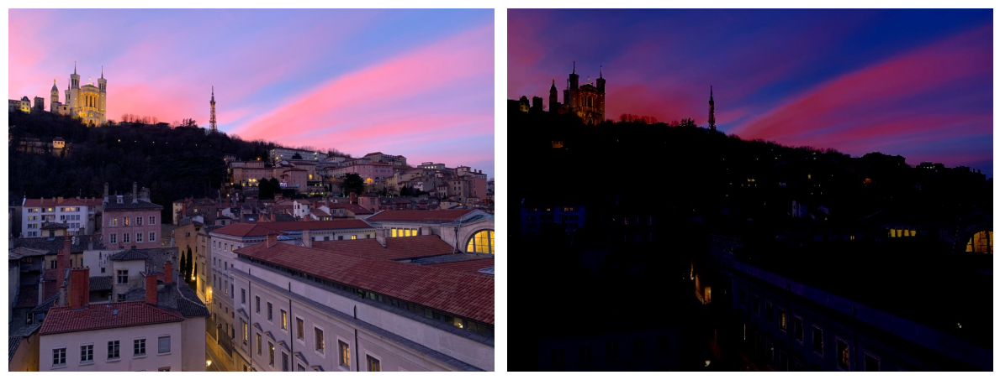

In [13]:
# img = prepare_img("data/content-images/lyon.jpg", 400, 'cpu')
# img_numpy = img.squeeze(0).permute(1, 2, 0).cpu().numpy()
# save_image(img_numpy, './img_lyon.jpg')
display_images_side_by_side("./data/content-images/lyon.jpg", './illustrations/lyon_treated.jpg')

# 2. Model Preparation

First, we will implement the function to load and prepare the VGG19 model, which serves as the foundation for our NST.  
Before anything else, let's take a look at this model, which we load already pre-trained from Pytorch.


In [14]:
from torchvision import models

model_init = models.vgg19(pretrained=True)
print(model_init)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

<center>
        <img src="illustrations/archivgg19.png" alt="VGG19" width="700">
        <figcaption>Diagram of the different layers of the  VGG19 model.</figcaption>
</center>
    


<div class="alert alert-info">

**VGG19**

**VGG19** is a convolutional neural network (CNN) trained on millions of images from various categories, including those from the ImageNet database (mentioned earlier). It is an improvement over another CNN, VGG16, with more convolutional layers than its predecessor, 19. The layers are detailed in the diagram above.  
VGG models were initially trained for image classification. However, they can easily be used for other purposes. For example, one can **extract features from an image in specific layers** such as the convolutional layers, **to identify the content or style of an image**.


For NST, we will implement a slightly modified version of the pre-trained Vgg19 model. Below, we explain the changes and their justifications. For a more detailed view, feel free to explore the code of the *Vgg19* class in the **models** section. This class is specifically designed for NST needs, allowing the extraction of intermediate representations from layers for both content and style. This model has the following features:  
🔹 **Only the convolutional layers and pooling layers** from the VGG19 model are extracted, as they are necessary for processing low-level features (used in NST).  
🔹 By default, we have made the following choice: the **conv4_2** layer is used to represent content in the context of NST. Why? It is a relatively deep layer in the VGG19 network. It captures high-level information, such as the global shapes and structures of an image, rather than low-level details like textures or local patterns. However, unlike very deep layers (like those after conv5), conv4_2 retains enough spatial localization to preserve the image's geometric structure. It is worth noting that using a single layer for content is justified by its unified structure and simplicity in optimization (using multiple layers does not really improve the results). In the "**6. Discussion and Comparisons**" section of the notebook, we will compare the results obtained by selecting a different *content* layer, other than **conv4_2**.  
🔹 The **other layers** are used to capture the style features (*see diagram*). By using multiple layers, the style is described by a diverse set of features, ranging from simple patterns (textures) to more complex relationships (pattern correlations). Shallow layers (like ***layer1_1***) capture low-level information such as fine textures or local patterns, while deeper layers (like ***layer5_1***) capture more global and abstract style information.

Let's prepare such a model and look at its characteristics!


In [15]:
def prepare_model(device):
    '''
    Loads the pre-trained VGG model.
    Identifies the indices of the model layers used to extract content and style features.
    Returns the model ready for use.
    '''
    model = MODEL   # We do not compute gradients as we do not want to train the model here.
    content_feature_maps_index = model.content_feature_maps_index   # Index of the specific network layer used to extract image content features.
    style_feature_maps_indices = model.style_feature_maps_indices   # Indices of the layers used to extract style features.
    layer_names = model.layer_names
    content_fms_index_name = (content_feature_maps_index, layer_names[content_feature_maps_index])
    style_fms_indices_names = (style_feature_maps_indices, layer_names)
    return model.to(device).eval(), content_fms_index_name, style_fms_indices_names


In [16]:
model = Vgg19(requires_grad=False, show_progress=True)   
print(model)

Vgg19(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
  )
  (slice4): Sequential(
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): R

In addition to the explanations provided above, the analysis of the generated model shows a segmentation of the model into **"slices"** (for reference, the code of this class is available in *models*, to fully understand how these slices are defined. This is an important parameter because the way these slices are created determines which layers are used for style representation and which one is used for content). The main purpose of the "slices" is to **split a pre-trained model into several parts in order to access the intermediate representations generated at different levels of the network**. These representations allow us to analyze the information extracted at different scales, ranging from simple features (edges, textures) to more complex structures (objects, global patterns). They will be particularly useful for calculating the Gram matrices, which capture the correlations between filters at different levels and serve to represent the style. Patience, this will be the topic of the next section! But before that, let's illustrate these 'slices' on the previous diagram:


<center>
        <img src="illustrations/archivvg_slices.png" alt="VGG19_slices" width="700">
        <figcaption>Diagram of the NST-adapted VGG model</figcaption>
</center>

Once again, we remind you that the choice of slice boundaries is arbitrary: it is entirely possible to select others. This especially allows for choosing a different convolution layer to represent the content. We will discuss this in **Section 6. Discussion and Comparisons**.  
It is also important to note that we have **not selected the convolutional layers beyond conv5_1**. This choice is also arbitrary, but it is made to maintain a good balance between performance, computational cost, and optimization stability.

<div class='alert alert-info'>

One choice that is not arbitrary, however, is **the exclusion of the *Classifier* part (on the right of the diagram)**. This part is not useful for NST. The fully connected (dense) layers at the end of the network are designed to take these features and perform classification. The *Classifier* part is trained to distinguish categories, not to represent styles or contents. The fully connected layers of the *Classifier* flatten the spatial features into a 1D vector. **Therefore, these should not be considered here**.

</div>


# 3. Style Representation and Gram Matrices


How could the "style" of an image be represented? It seems to be a difficult concept to define, yet intuitive. Indeed, it's clear that Pablo Picasso and Claude Monet create works with very distinct styles. In the first approach, style could be defined by **global patterns and textures (e.g., brushstrokes, repetition of colors, etc.)**. What if this style could be found within the filters of CNN layers?

<center>
    <table>
        <tr>
            <td style="text-align: center;">
                <img src="illustrations/monnet.jpg" alt="Monnet" width="300">
                <figcaption>'Les Nymphéas' by C. Monet</figcaption>
            </td>
            <td style="text-align: center;">
                <img src="illustrations/picasso.jpg" alt="Picasso" width="300">
                <figcaption>'Maya Ruiz-Picasso' by P. Picasso</figcaption>
            </td>
        </tr>
    </table>
</center>

<div class='alert alert-info'>

**CNN Structure**

To explore this, let's look at the detailed structure of a CNN. Remember, a CNN consists of multiple layers. For example, the VGG16 CNN illustrated below has 16 layers. A layer can be a convolutional layer with ReLU (in black below), max-pooling (in red), softmax (in orange), etc. 

<center>
        <img src="illustrations/vgg16.png" alt="VGG16" width="500">
        <figcaption>VGG16 model diagram.</figcaption>
</center>

The convolutional layers themselves are made up of filters. For reminder, a filter is a convolution. It is a small kernel of weights that slides over the image and extracts features like edges, textures, or complex patterns. Each filter, due to its particular kernel of weights, detects a specific feature. A convolutional layer applies multiple filters to the input, generating several activation maps.
For example, in the first convolutional layer of VGG-16 illustrated above:  
🔹 The input is 224×224×3 (RGB image with 3 channels)  
🔹 64 filters are applied, so the output becomes 224×224×64 (64 feature maps).  
This process is repeated 64 times to obtain 64 feature maps.

<center>
        <img src="illustrations/convnet.gif" alt="Convolutions" width="500">
        <figcaption>Illustration of the convolution process</figcaption>
</center>

</div>


With this reminder in mind, the main takeaway is as follows: **the filters of the different layers in our VGG19 model extract texture features at different levels of the image.**  
Let's take two filters, $i$ and $j$, from the same layer. If these two filters are strongly correlated, it means they often detect similar patterns in the image. This concept is key to understanding the next steps. Let’s take a moment to explore an intuitive example to fully grasp this idea.

<div class='alert alert-warning'>

**Example:**

Let’s assume:  
🔹 The image in question is a painting by an artist.  
🔹 Filter $i$ detects blue diagonal lines.  
🔹 Filter $j$ detects round yellow spots.  
If the two filters are strongly correlated, it means these patterns often appear together in the image. Intuitively, this means that these aspects correspond to the artist's style, as we find them together regardless of their spatial position, the level of detail, or the content of the image itself.

</div>

At this point, all we need to do is find a way to evaluate and represent the correlation between the different filters in a layer. This is where the **Gram matrix** comes into play!


<center>
        <img src="illustrations/gram.png" alt="Gram" width="700">
        <figcaption>Gram Matrix</figcaption>
</center>

<div class="alert alert-info">

**Gram Matrix**

🔹 A **Gram matrix** is used to represent the correlations between the filters in a given layer.  
🔹 $G^l$ is a symmetric matrix of dimensions $N_l × N_l$, where $N_l$ is the number of filters in layer $l$.  
🔹 Each element of this matrix $G^l_{ij}$ represents the dot product between the vectorized responses of filters $i$ and $j$ over the entire spatial extent of the image.  

$$
G^l_{ij} = \sum_k F^l_{ik} F^l_{jk}
$$

where $k$ runs over spatial positions on the feature maps.  

🔹 The dot product between the responses of filters $i$ and $j$ captures the degree of similarity between them. If two filters respond similarly to different patterns in the image, their dot product will be high. In summary, the Gram matrix encodes how the filters "cooperate" to represent the patterns in the image, which, as a reminder, is related to the texture and style of the image.

</div>


Let's implement the calculation of Gram matrices.

In [17]:
def gram_matrix(x, should_normalize=True):
    '''
    Generate Gram matrices of the representations of content and style images.
    Input: x, a tensor (b, ch, h, w).
    Output: a matrix (b, ch, ch) capturing the relationships between channels.
    '''
    (b, ch, h, w) = x.size() # x is a tensor of size (batch_size, channels, height, width)
    features = x.view(b, ch, w * h) # reshapes x into a matrix of size (b, ch, w*h)
    features_t = features.transpose(1, 2)
    gram = features.bmm(features_t) # matrix product between features and its transpose features_t
    if should_normalize:
        gram /= ch * h * w # normalizes the Gram matrix to prevent it from being influenced by the feature size
    return gram


# 4. Définitions et calculs des pertes

We are almost ready to implement our final NST function, with just one small detail left! In NST, we directly optimize the pixels of the generated image by minimizing a loss function. Therefore, it is essential to define this loss function. Without giving too much away, here’s how our algorithm will work:  
🔹 **Initialization**: We start with the *content* image provided initially.  
🔹 **Iteration**: Once the loss is calculated, image $n+1$ is generated from image $n$ based on backpropagation to compute the gradient of the loss with respect to the pixels. This gives us the direction and intensity of changes to apply to the pixels.  
🔹 **Stopping**: After a predefined number of iterations.

<div class='alert alert-info'>

**Loss Function**

Given this process, it is crucial to have an **appropriate loss function.**  
This loss function will be a bit special compared to usual loss functions. It will be divided into 3 parts:  
🔹 ***Content loss***: ensures that the generated image retains the same content as the original image.  
🔹 ***Style loss***: ensures that the generated image has a style similar to the *style image*.  
🔹 ***Total variation***: encourages spatial continuity and prevents the generated image from having too much noise. This part of the loss helps "smooth" the image and make it look more natural. It penalizes abrupt and intense pixel variations in spatial proximity.

</div>


<div class="alert alert-warning">

**Comprehension Question:**

Using the loss definitions and the description of the algorithm above:

- What will be the value of the content loss before the first iteration? How will it evolve during the first few iterations?

- How will the style loss evolve during the first few iterations?

</div>


<details class="alert alert-warning">
<summary markdown="span"><b>Solution (Click to reveal)</b></summary>

- The *content loss* will be zero before the first iteration. Indeed, the algorithm is initialized with the *content image*. The first iterations will gradually modify the image to incorporate the style of the *style image*. Therefore, the *content loss* will initially increase.

- The *style loss* will decrease as the first iterations progress.

These statements will be illustrated later in the **5. Final Implementation and Results** section.
</details>


The next 3 sections will go into more detail about the theory behind the 3 parts of the loss. These parts provide insights into the importance of each one and the overall functioning of the algorithm that follows. Their construction is essential: they play a key role in the outcome of our algorithm. That's why we encourage you to take a look at them. However, if you're really eager to discover the general algorithm and its results, and the theoretical details of the loss functions don't interest you, you can skip the next 3 sections.


## Content Loss

<details class="alert alert-info">
<summary markdown="span"><b>Content Loss (Click to view the theory!)</b></summary>

We revisit the notations from earlier, which we will recall: when an input image $x$ is processed by the network, it is encoded at each layer through the responses of the filters applied to the image. Each layer $l$ having $N_l$ distinct filters generates $N_l$ feature maps, each with a size of $M_l$, representing the height and width of the map.

The responses in layer $l$ can be stored in a matrix $F_l ∈ R^{N_l × M_l}$, where $F_{l,ij}$ represents the activation of the $i$-th filter at position $j$ in layer $l$.

To visualize the information encoded by the different layers of the network, our approach is to apply gradient descent on the generated image $x$ to generate a new image that more closely matches the feature responses of the original image $p$. If $p$ is the original image and $x$ is the generated image, $P_l$ and $F_l$ represent their respective representations in layer $l$, we define a squared error loss between the two feature representations:
$$
L_{\text{content}}(p, x) = \frac{1}{2} \sum_{ij} \left( F_{l, ij} - P_{l, ij} \right)^2
$$


## Style Loss

<details class="alert alert-info">
<summary markdown="span"><b>Style Loss (Click to view the theory!)</b></summary>

Let's first focus on a single layer. We revisit the notations of the Gram matrix from the previous section, in a layer $l$.  
The **style loss per layer $(E^l)$** is expressed as:
$$
E^l= \frac{1}{4N_l^2M_l^2} \sum_{i,j} \left(G^l_{ij} - A^l_{ij}\right)^2
$$
where  

- $G^l_{ij}$: The Gram matrix of the generated image in layer $l$, which captures the correlations between the responses of the filters in that layer.
- $A^l_{ij}$: The Gram matrix of the style image in the same layer.
- $N_l$: The number of filters in layer $l$.
- $M_l$: The spatial size of the feature maps in layer $l$ (height × width).

### Explanation of the expression

1. **Mean Squared Error (MSE)**:
    - The loss evaluates how much the Gram matrix of the generated image deviates from the Gram matrix of the style image.
    - The difference quantifies how different the correlations of filters $i$ and $j$ are between the two images.
    - Squaring this difference penalizes both positive and negative deviations equally.
2. **Normalization factor**:
    - The term normalizes the loss so it is comparable across layers, regardless of their size or number of filters.
        - $N_l^2$: Accounts for the total number of correlations (filter pairs) in the layer.
        - $M_l^2$: Normalizes based on the spatial size of the feature maps.

We now have the expression for the style loss within a single layer. Let's extend the calculation to all layers to find the total style loss, $L_{style}(a,x)$:

$$L_{style}(a,x)= \sum_{l} w_l E^l$$

where:
- $a$: the *style image* (original)
- $x$: the generated image
- $w_l$: Weighting factors that determine the contribution of the style loss of each layer to the total loss.
- $E^l$: The style loss per layer as described above.

### Why sum over all layers?

1. **Multi-scale representation of style**:
    - Different layers of a CNN capture different levels of abstraction:
        - **Shallow** layers capture fine patterns (textures, edges).
        - **Deep** layers capture more abstract and global structures (shapes, organization).
    - To capture the global style, the loss aggregates the contributions from the different layers.
2. **Weighting factors ($w_l$)**:
    - Some layers may be more important for the perceived style of an image.
    - The $w_l$ factors allow adjusting the relative influence of each layer based on its importance.
    - **Note**: In our case, we will choose to average across layers, i.e., all $w_l$ will be equal.

### **Derivative of $E^l$:**

The derivative of $E^l$ with respect to the activations in layer $l$ can be calculated analytically since the Gram matrix is a quadratic function of the activations ($F^l$). We will see that this derivative is necessary for optimizing the generated image $x$ using gradient descent.


## Total Variation

The goal is to measure the differences between adjacent pixels, as excessive variations introduce visual noise. Indeed, without any constraint, the optimization process may create noisy or overly detailed artifacts.  
By adding a total variation regularization, we encourage smoother transitions between pixels, making the image appear more natural.  
Below is the section of code for total variation:


In [18]:
def total_variation(y):
    '''
    Calculate total variation.
    '''
    return torch.sum(torch.abs(y[:, :, :, :-1] - y[:, :, :, 1:])) + torch.sum(torch.abs(y[:, :, :-1, :] - y[:, :, 1:, :]))

<details class="alert alert-info">
<summary markdown="span"><b>Total Variation (Click to view the code explanation!)</b></summary>

The explanation of the previous code will help understand how this part of the loss is calculated.  
This part of the loss is composed of 2 terms: 
  
- The **horizontal variation** between adjacent pixels:
    - y[:, :, :, :-1]: selects all pixels except those in the last column.  
    - y[:, :, :, 1:]: selects all pixels except those in the first column.  
    - y[:, :, :, :-1] - y[:, :, :, 1:] gives the difference between horizontally adjacent pixels.  
    - We then sum all the absolute differences using torch.sum().  
          
- The **vertical variation** between adjacent pixels: 
    Similarly, we sum the differences between vertically adjacent pixels. 

We then add these 2 terms, which give a global measure of the image's roughness.


## Total Loss
<div class='alert alert-info'>

Now that we have defined the 3 parts of the loss, we are ready to express the total loss:

$$
Loss_{total}=λ_C​×Loss_{Content}+λ_S​×Loss_{Style}+λ_{TV}​×Loss_{TV}
$$

with:  
$λ_C$, $λ_S$, and $λ_{TV}$ the weights that allow balancing the influence of each part of the loss.

</div>

We pass these weights as arguments within the *config* parameter in the following function for calculating the total loss:


In [19]:
def build_loss(neural_net, optimizing_img, target_representations, content_feature_maps_index, style_feature_maps_indices, config):
    '''
    Arguments: 
    neural_net: the neural network (VGG19 here)
    optimizing_img: the generated image that is updated to resemble the content while adopting the style.
    target_representations: tuple containing:
        target_content_representation → Representation of the content image.
        target_style_representation → List of Gram matrices of style features.
    content_feature_maps_index: index of the layer used for content loss (e.g., conv4_2).
    style_feature_maps_indices: indices of the layers used for style loss (e.g., [relu1_1, relu2_1, relu3_1, relu4_1, relu5_1]).
    config: dictionary containing the weights of different losses (content_weight, style_weight, tv_weight).

    Output:
    Computation of content_loss, style_loss, and total_variation_loss.
    '''
    target_content_representation = target_representations[0]
    target_style_representation = target_representations[1]
    current_set_of_feature_maps = neural_net(optimizing_img)  # get the current feature maps
    current_content_representation = current_set_of_feature_maps[content_feature_maps_index].squeeze(axis=0) # features of the selected content layer (conv4_2 by default).
    content_loss = torch.nn.MSELoss(reduction='mean')(target_content_representation, current_content_representation)
    style_loss = 0.0
    current_style_representation = [gram_matrix(x) for cnt, x in enumerate(current_set_of_feature_maps) if cnt in style_feature_maps_indices] # compute the Gram matrix of the optimized image's feature maps.
    for gram_gt, gram_hat in zip(target_style_representation, current_style_representation):
        style_loss += torch.nn.MSELoss(reduction='sum')(gram_gt[0], gram_hat[0]) # Compare the Gram matrices of the optimized image and the style image using MSE
    style_loss /= len(target_style_representation) # average the loss over all style layers.
    tv_loss = total_variation(optimizing_img)
    total_loss = config['content_weight'] * content_loss + config['style_weight'] * style_loss + config['tv_weight'] * tv_loss
    return total_loss, content_loss, style_loss, tv_loss


Désormais, nous disposons de toutes les sous-fonctions nous permettant de créer notre fonction de NST principale !


# 5. Final Implementation and Results


### Global Functionality of the Function

This function *neural_style_transfer* implements the Neural Style Transfer (NST) algorithm based on VGG19 and the L-BFGS optimizer. It takes a *content image* and a *style image* as input (via the *config* parameter) and generates **a merged image** by minimizing the loss function defined above.


Unlike a classic neural network training where the model weights are adjusted, here it is the pixels of the generated image that are updated, iteration after iteration.  
We define the optimized image as a variable requiring gradient computation: *optimizing_img = Variable(init_img, requires_grad=True)*  

🔹 This means that **each pixel of the generated image becomes an optimizable parameter**.  
🔹 These pixels will be gradually modified to minimize the total loss, iteration after iteration.  

<div class='alert alert-success'>

At each iteration:

🔹We **calculate the total loss** (Content + Style + TV).  
🔹We **calculate the gradients of the loss** with respect to the pixels (Backpropagation).  
🔹**The L-BFGS optimizer updates the pixels** based on the gradients and dynamically adjusts the step size.  
🔹The generated image progressively becomes **closer to the target style and content**.

</div>


The number of iterations was defined at the beginning of the notebook in the variable **NUM_ITERATIONS**. We will discuss its influence later, and you can modify it to see the differences in practice!


In [20]:
def neural_style_transfer(config):
    '''
    The main Neural Style Transfer method.
    '''
    content_img_path = os.path.join(config['content_images_dir'], config['content_img_name'])
    style_img_path = os.path.join(config['style_images_dir'], config['style_img_name'])
    out_dir_name = 'combined_' + os.path.split(content_img_path)[1].split('.')[0] + '_' + os.path.split(style_img_path)[1].split('.')[0]
    dump_path = os.path.join(config['output_img_dir'], out_dir_name)
    os.makedirs(dump_path, exist_ok=True)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    content_img = prepare_img(content_img_path, config['height'], device)
    style_img = prepare_img(style_img_path, config['height'], device)
    
    init_img = content_img
    
    optimizing_img = Variable(init_img, requires_grad=True)
    neural_net, content_feature_maps_index_name, style_feature_maps_indices_names = prepare_model(device)
    print(f'Using VGG19 in the optimization procedure.')
    content_img_set_of_feature_maps = neural_net(content_img)
    style_img_set_of_feature_maps = neural_net(style_img)
    target_content_representation = content_img_set_of_feature_maps[content_feature_maps_index_name[0]].squeeze(axis=0)
    target_style_representation = [gram_matrix(x) for cnt, x in enumerate(style_img_set_of_feature_maps) if cnt in style_feature_maps_indices_names[0]]
    target_representations = [target_content_representation, target_style_representation]
    num_of_iterations = NUM_ITERATIONS
    
    optimizer = LBFGS((optimizing_img,), max_iter=1, line_search_fn='strong_wolfe')
    cnt = 0

    def closure():
        nonlocal cnt
        if torch.is_grad_enabled():
            optimizer.zero_grad()
        total_loss, content_loss, style_loss, tv_loss = build_loss(neural_net, optimizing_img, target_representations, content_feature_maps_index_name[0], style_feature_maps_indices_names[0], config)
        if total_loss.requires_grad:
            total_loss.backward()
        with torch.no_grad():
            print(f'L-BFGS | iteration: {cnt:03}, total loss={total_loss.item():12.4f}, content_loss={config["content_weight"] * content_loss.item():12.4f}, style loss={config["style_weight"] * style_loss.item():12.4f}, tv loss={config["tv_weight"] * tv_loss.item():12.4f}')
            save_and_maybe_display(optimizing_img, dump_path, config, cnt, num_of_iterations)
        cnt += 1
        return total_loss
    while cnt < num_of_iterations +1:
        optimizer.step(closure) # L-BFGS updates the generated image
    return dump_path

*closure()* is an internal callback function used by L-BFGS. It calculates the loss and performs backpropagation.  
This function performs the following actions:  
- Clears the previous gradients (optimizer.zero_grad())  
- Recalculates the loss (build_loss(...))  
- Computes the new gradients (total_loss.backward())  
Then the generated image is updated (optimizer.step(closure))  


The following sections focus on a more detailed exploration of certain aspects of the algorithm:  
- Backpropagation  
- The LBFGS optimizer  
  
As before, feel free to read them or jump straight to the next sections!


## Backpropagation

<details class="alert alert-info">
<summary markdown="span"><b>Computing the Derivative Needed for Gradient Descent (Click to view)</b></summary>

**In the case of Content Loss**  

For content loss, backpropagation is straightforward and follows the standard process we’ve seen in class.  
Referring to the content loss expression defined previously: 
$$
L_{\text{content}}(p, x) = \frac{1}{2} \sum_{ij} \left( F_{l, ij} - P_{l, ij} \right)^2
$$

Its derivative is expressed as:

$$
\frac{\partial L_{\text{content}}}{\partial F_{l, ij}} = 
\begin{cases} 
F_{l, ij} - P_{l, ij} & \text{if } F_{l, ij} > 0 \\
0 & \text{if } F_{l, ij} < 0 
\end{cases}
$$

The second case gives a derivative of zero because the ReLU activation function ignores negative values.  
From here, the gradient with respect to the image $x$ can be computed through error propagation, which allows us to modify the generated image $x$ iteratively to make the feature map responses from a given layer of the CNN closer to the original image $p$.

**In the case of Style Loss**  

While the backpropagation process has been explained in previous lessons and illustrated above, it's interesting to focus on the backpropagation process for style loss. The use of Gram matrices introduces some slight differences. As mentioned earlier, the derivative of $E^l$ with respect to the layer activations $F^l$ can be calculated analytically because the Gram matrix is a quadratic function of the activations ($F^l$).

→ This derivative is required to optimize the generated image $x$ using gradient descent.  
→ It ensures that updates to $x$ progressively reduce the style loss by aligning $G^l$ with $A^l$.

Using the chain rule, the derivative of $E^l$ with respect to $F^l_{ij}$ is:

$$\frac{\partial E^l}{\partial F^l_{ij}} = \sum_{k} \frac{\partial E^l}{\partial G^l_{ik}} \cdot \frac{\partial G^l_{ik}}{\partial F^l_{ij}}.$$

---

The style loss $E^l$ is quadratic with respect to the Gram matrix $G^l$, so its derivative with respect to $G^l_{ij}$ is straightforward:

$$\frac{\partial E^l}{\partial G^l_{ij}} = \frac{1}{2N_l^2M_l^2} (G^l_{ij} - A^l_{ij}).$$

---

From the definition of $G^l_{ij}$, we have:

$$G^l_{ij} = \sum_k F^l_{ik} F^l_{jk}.$$

Taking the derivative of $G^l_{ij}$ with respect to $F^l_{pq}$, we get:

- If $p=i$:
    
    $$\frac{\partial G^l_{ij}}{\partial F^l_{pq}} = F^l_{jq}.$$
    
- If $p=j$:
$$\frac{\partial G^l_{ij}}{\partial F^l_{pq}} = F^l_{iq}.$$
- Otherwise, the derivative is zero.

This shows that the derivative depends on the activations at the corresponding spatial positions.

This leads to the formula:
$$
\frac{\partial E^l}{\partial F^l_{ij}} = \frac{1}{N_l^2M_l^2} \left( (F^l)^T (G^l - A^l) \right)_{ji}.
$$
if $F^l_{ij} > 0 $

Gradient descent is then performed using this derivative expression.


## Optimiseur L-BFGS

<details class="alert alert-info">
<summary markdown="span"><b>Functioning and Benefits of L-BFGS (Click to view)</b></summary>

L-BFGS (Limited-memory Broyden–Fletcher–Goldfarb–Shanno) is a numerical optimization algorithm used to minimize functions. It is an improved version of BFGS (Broyden-Fletcher-Goldfarb-Shanno), a quasi-Newtonian method.

In the context of Neural Style Transfer, L-BFGS is used to optimize the generated image by minimizing a loss function like ours, which combines content, style, and total variation.  
L-BFGS is a constraint-free optimization method, particularly efficient for high-dimensional problems where the Hessian matrix (second derivative) is too large to be stored in memory.  
Unlike classical optimization, where gradient descent uses the first derivative to find a minimum, Newton-type methods use the Hessian matrix (second derivatives) for faster convergence. L-BFGS approximates the Hessian matrix without storing it by using a limited memory of gradient updates.

Why use L-BFGS for Neural Style Transfer?  

🔹**Faster Convergence**: L-BFGS converges much faster than standard gradient descent methods (such as Adam, the optimizer frequently used in deep learning).  
🔹Additionally, it does **not require tuning the learning rate**: it automatically adjusts the step size via line search.  
🔹It is also **more efficient for batch-less problems**: unlike Adam or SGD, which are designed for mini-batches, L-BFGS works well on a single example (in our case, an optimized image in NST).

For more information on L-BFGS, feel free to check out the documentation: https://pytorch.org/docs/stable/generated/torch.optim.LBFGS.html  
or this link: https://medium.com/towards-data-science/numerical-optimization-based-on-the-l-bfgs-method-f6582135b0ca


The *neural_style_transfer* function above takes a single argument: *config*. Therefore, we need to create this variable, which consists of several elements:  
🔹**content and style images**.  
🔹**weights for the different parts of the loss function**.  
🔹**height**: The height in pixels to which the content and style images will be resized before being processed by the model.  

At first, we suggest running the function again with the parameters below. Later, it will be interesting to vary certain parameters to observe their respective influences! This will be explored in the following section.


In [21]:
optimization_config = {'content_img_name': CONTENT_IMAGE, 'style_img_name': STYLE_IMAGE, 'height': 400, 'content_weight': 100000.0, 'style_weight': 30000.0, 'tv_weight': 1.0}
optimization_config['content_images_dir'] = content_images_dir
optimization_config['style_images_dir'] = style_images_dir
optimization_config['output_img_dir'] = output_img_dir
optimization_config['img_format'] = img_format

We can now run our final function with the parameters chosen above.


In [22]:
results_path = neural_style_transfer(optimization_config)

Using VGG19 in the optimization procedure.
L-BFGS | iteration: 000, total loss=7206550896640.0000, content_loss=      0.0000, style loss=7206540960000.0000, tv loss=9852321.0000
L-BFGS | iteration: 001, total loss=7206546702336.0000, content_loss=      0.0006, style loss=7206536640000.0000, tv loss=9852321.0000
L-BFGS | iteration: 002, total loss=7206543032320.0000, content_loss=      0.0016, style loss=7206533280000.0000, tv loss=9852321.0000
L-BFGS | iteration: 003, total loss=7206542508032.0000, content_loss=      0.0022, style loss=7206532800000.0000, tv loss=9852321.0000
L-BFGS | iteration: 004, total loss=7206509477888.0000, content_loss=      0.0621, style loss=7206499680000.0000, tv loss=9852331.0000
L-BFGS | iteration: 005, total loss=7206324404224.0000, content_loss=      1.8751, style loss=7206314400000.0000, tv loss=9852376.0000
L-BFGS | iteration: 006, total loss=7204290166784.0000, content_loss=    187.5749, style loss=7204280160000.0000, tv loss=9852870.0000
L-BFGS | ite

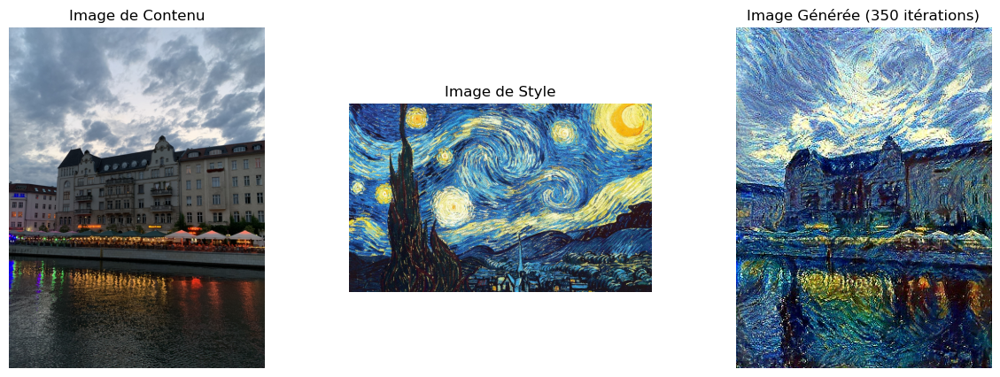

In [23]:
display_generated_image(CONTENT_IMAGE, STYLE_IMAGE, NUM_ITERATIONS)

The details of the generated images can be found in the *output_images* file!


<div class="alert alert-warning">

**Bonus: Create your own GIF like the one you saw at the beginning!**

In fact, we chose not only to save the final image displayed above but also intermediate images during the construction of your generated image!  
By combining all these images, you can create a GIF similar to the one at the beginning of the notebook.  
To do so, run the code below!

</div>


In [24]:
content_name = os.path.splitext(CONTENT_IMAGE)[0]
style_name = os.path.splitext(STYLE_IMAGE)[0]
output_folder = f"combined_{content_name}_{style_name}"
generated_images_path = os.path.join("./data/output-images", output_folder)
generated_gif_path = os.path.join("./data/gifs_generated", f"{output_folder}.gif")

In [25]:
create_gif_from_images(generated_images_path, generated_gif_path)

GIF créé avec succès : ./data/gifs_generated/combined_berlin_van_gogh.gif


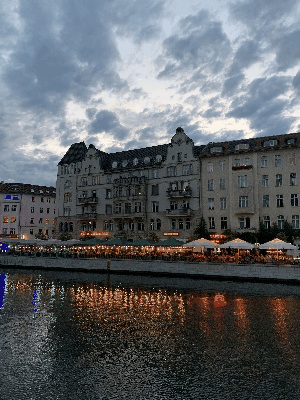

In [26]:
display_gif(generated_gif_path)

Pretty cool, right? Worthy of a spot in the Louvre Museum?  
You must be eager to generate a new image with different parameters and/or different content and style images. Go ahead, give it a try!  

As for the parameters, part of the work is already done below. Through various examples, we will discuss the importance of certain parameters.  


# 6. Discussion and Comparisons


## 6.1 Number of Iterations

Let's illustrate the influence of the number of iterations on the final image:
First, let's take the image you just generated:



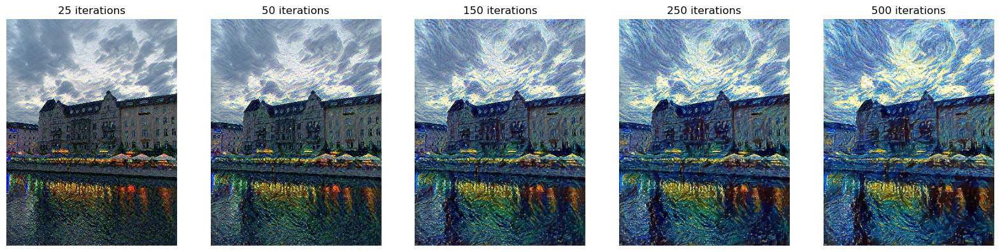

In [27]:
images, iterations = select_files(generated_images_path)
display_five_images(images, iterations)

Let's take another example:

![alt text](illustrations/comparaison_iterations.png)


We observe that the content gradually fades (in favor of the style?) as the number of iterations increases. Even though the total loss is optimized and a balance between content and style loss is eventually reached, each iteration modifies the previous image, further distancing it from the original content image. 

The differences are most noticeable at a low number of iterations and diminish as the number of iterations increases. This is precisely what we observe here.


## 6.2 Average Pooling vs Max Pooling

<center>
        <img src="illustrations/poolings.png" alt="Poolings" width="500">
        <figcaption>Comparison Max Pooling vs Average Pooling </figcaption>
</center>

<div class="alert alert-info">

**Reminder - Pooling Layers**  

Pooling layers are used in convolutional neural networks (CNNs) to **reduce the size of feature maps while retaining essential information**. They help decrease computational complexity and minimize the risk of overfitting.  

There are two main types of pooling:  
- **Max pooling**, used in the VGG19 model, selects the maximum value within a region, effectively capturing the most important features of the image.  
- **Average pooling**, which takes the average of the values in a region, smoothing information and reducing variations.  

</div>


Reading research papers, particularly the work of Gatys et al., suggests that using *average pooling* instead of *max pooling* in the VGG19 model yields better results. Let's compare!  

Here is the model using average pooling:


In [28]:
model_avg_pool = VGG_avg_pool(requires_grad=False, show_progress=True)   
print(model_avg_pool)

VGG_avg_pool(
  (slice1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
  )
  (slice2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
  )
  (slice3): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): AvgPool2d(kernel_size=2, stride=2, padding=0)
    (3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
  )
  (slice4): Sequential(
    (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(256, 256, kernel_size=(

We notice that this model is identical to the previous one, except that max pooling has been replaced by average pooling.  
Let's compare their respective outputs:


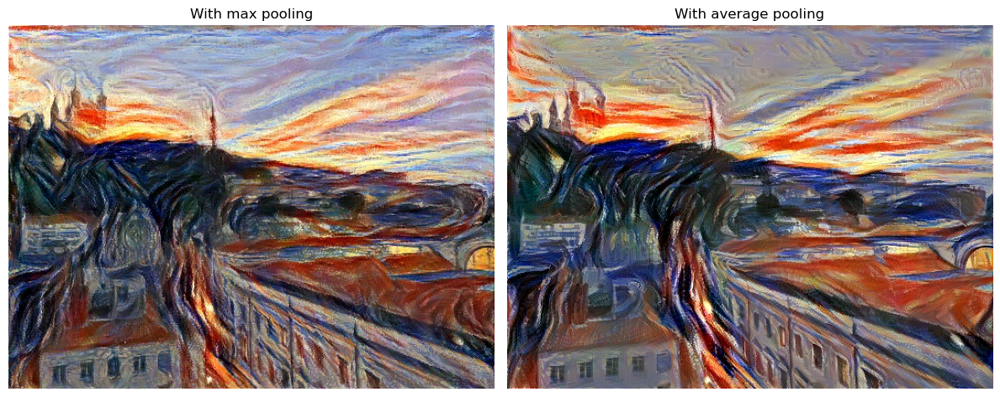

In [29]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', './illustrations/lyon_munch_300_avg_pool.jpg', 
                            titles=['With max pooling', 'With average pooling'])

There are quite noticeable differences between the results obtained from these two models, at least in this example.  
The conclusion that *average pooling* yields better results than *max pooling* is left to the reader's judgment, given the subjectivity of such an assessment.


## 6.3 Choosing the Layer for *Content* Representation

<div class='alert alert-info'>

Articles on Neural Style Transfer (NST) describe the theoretical role of different convolutional layers in the VGG model:

🔹 **Deeper layers (e.g., conv5)**: Capture highly abstract and global information. Choosing such a layer would result in the loss of many spatial details and local structures, potentially leading to a loss of precise shapes and visual details from the content image.

🔹 **Intermediate layers (e.g., conv4_2)**: Strike a balance between low-level details (such as edges and structures) and high-level abstractions (such as shapes and relationships between objects). This choice helps retain essential details from the source image while allowing for flexible stylization.

🔹 **Shallow layers (e.g., conv1)**: Capture only very low-level features, such as edges or local patterns. These layers are not suitable for capturing global content since they do not grasp the broader structure or relationships of objects within the image.

</div>


We aim to illustrate this theory. To do so, we generate two images using the same parameters, based on the VGG19 model with *max pooling*, but with different content layers: one using *conv4_2* and the other using *conv1_2*.

Here are the results:


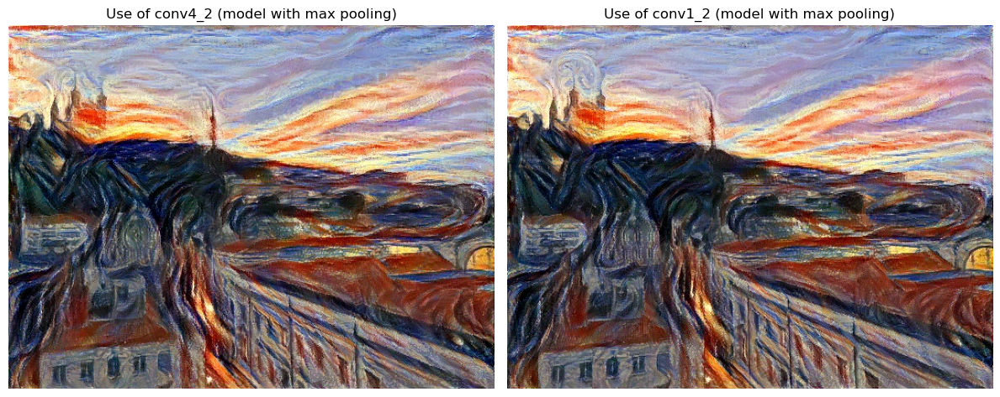

In [30]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/lyon_munch_300_conv1.jpg', 
                            titles=['Use of conv4_2 (model with max pooling)', 'Use of conv1_2 (model with max pooling)'])

The differences are subtle. Admittedly, it is not immediately obvious to observe the theoretical points mentioned above. Some variations can be noticed in colors and shapes (above the cathedral, the alley between the buildings, etc.).

To further investigate, let's use a heatmap to compare pixel colors one by one below.

*Note: A slight 'style overfitting' can be observed in the center-left of the image—one can notice the shape of the screaming figure from Munch's painting!*


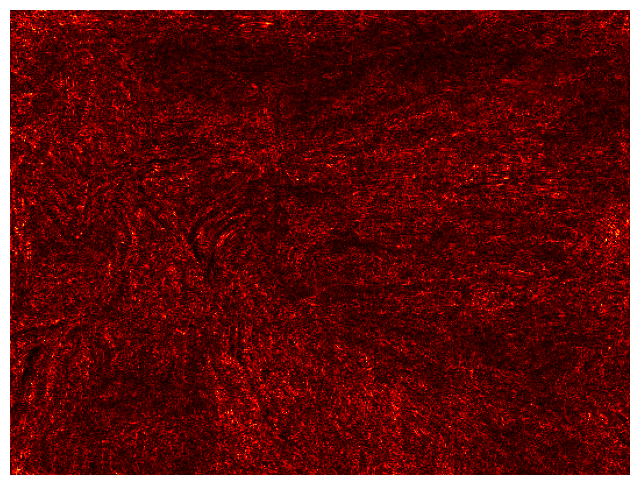

In [31]:
hm2 = generate_difference_heatmap('./illustrations/lyon_munch_300.jpg', './illustrations/lyon_munch_300_conv1.jpg')
show_heatmap(hm2)

The results above do not fully illustrate the theory presented in the papers. Driven by the desire to observe this theory in practice, we decide to make another attempt—this time using the second model, the one with *average pooling*.

Let's examine the results:


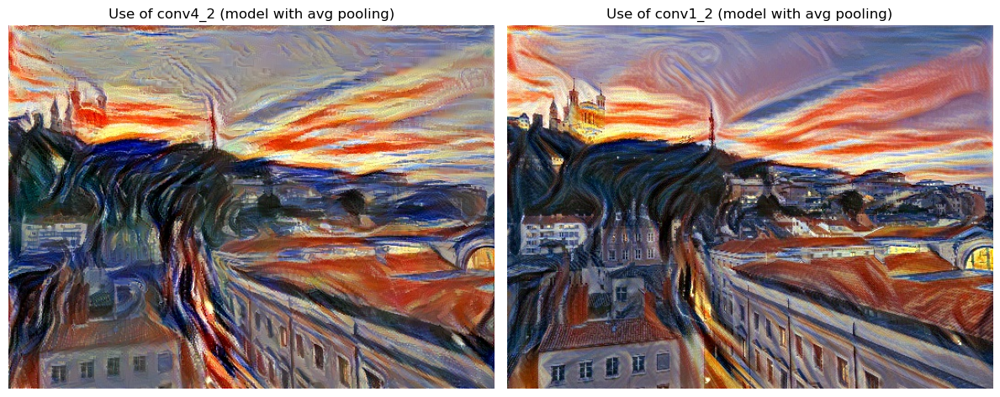

In [32]:
display_images_side_by_side('./illustrations/lyon_munch_300_avg_pool.jpg', 
                            './illustrations/lyon_munch_300_avg_pool_conv_1.jpg', 
                            titles=['Use of conv4_2 (model with avg pooling)', 'Use of conv1_2 (model with avg pooling)'])

This time, the theoretical elements mentioned at the beginning of this section are confirmed! Using a shallow layer (*conv1_2* here) produces a less natural result, giving the impression of a filter applied to a photograph.

Thus, we have illustrated an aspect that was not explicitly discussed in the papers: the **influence** of the choice of the content layer is strongly dependent on the prior choice between *average pooling* and *max pooling*!


## 6.4 Variation in the Distribution of Weights on the Loss


Let's examine the consequences of changing the weights assigned to the different terms in the total loss expression.

First, we will adjust the weights of the style and content losses. Starting from the default weights, we vary the ratio $λ_C / λ_S$ from 0.01 to 100 to study its influence.

*Note: The weight of the total variation loss remains unchanged for now.*


<center>
        <img src="illustrations/comparaison poids.png" alt="poids" width="1200">
        <figcaption>Illustration of the Influence of Weights </figcaption>
</center>


We observe the expected results: the style becomes more dominant as its weight increases relative to the content. Conversely, when the content weight is higher, the generated image retains more structural details from the original content image.


Now, let's examine the influence of the total variation loss. We compare the image generated using the default weights with an image generated with a total variation weight $λ_{TV}$ set to zero.


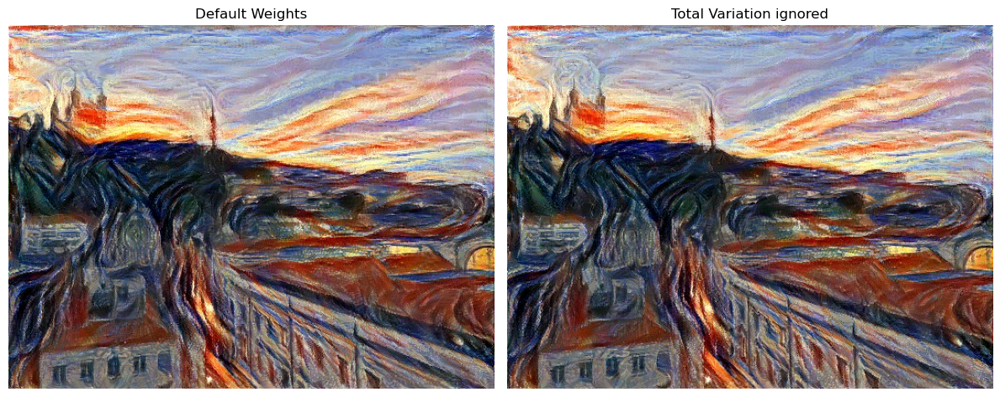

In [33]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/sans_tv.jpg', 
                            titles=['Default Weights', 'Total Variation ignored'])

We do not observe a significant difference, which can be explained by the initially low weight of the total variation loss.

What happens if we multiply the total variation weight $λ_{TV}$ by 1000 compared to the default weight?


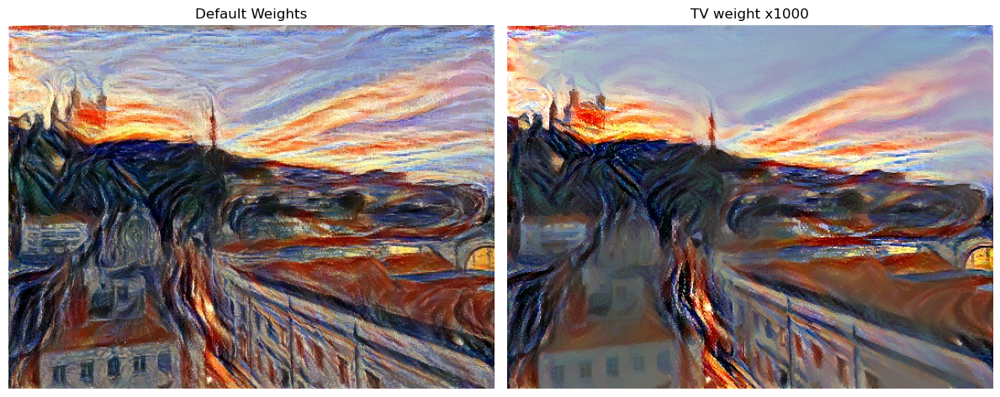

In [34]:
display_images_side_by_side('./illustrations/lyon_munch_300.jpg', 
                            './illustrations/tv1000.jpg', 
                            titles=['Default Weights', 'TV weight x1000'])

This comparison illustrates the theoretical role of total variation. By increasing the importance of this loss, the generated image exhibits fewer variations between adjacent pixels, making the regions more monochromatic.


To further illustrate the points discussed in the previous two sections, here is an image extracted from the paper by Gatys et al.  
From top to bottom, the layer used to represent the content becomes progressively deeper.  
From left to right, the weight given to the style loss relative to the content loss decreases.  

<center>
        <img src="illustrations/gatys.png" alt="gatys" width="700">
        <figcaption>Illustration of the influence of weights and the choice of content layer</figcaption>
</center>


<div class='alert alert-warning'>

**Your Turn!**

We have now covered the main parameters influencing the final generated image. If you have time, feel free to create your own images by revisiting Section 5 and experimenting with the different parameters mentioned above. Here are some key details to help you:  

🔹 The names of the content and style images are stored in the global variables **STYLE_IMAGE** and **CONTENT_IMAGE** at the beginning of the notebook.  
🔹 The number of iterations is set in the global variable **NUM_ITERATIONS**.  
🔹 The model using *average pooling* is available in the file *models/definitions*. To use it, change the model name in the **MODEL** variable at the beginning of the notebook!  
🔹 The loss weights are defined in the *config* parameter in Section 5.  

Changing the layer representing *content* requires modifying the model, but feel free to try it if you're interested!

</div>


<div class='alert alert-warning'>

**Going Further**:  

In this notebook, we have illustrated the theory and practice of Neural Style Transfer (NST) based on the approach described in Gatys et al.'s paper. However, there are alternative methods worth exploring:  

🔹 **Texture modeling with Markov Random Fields (MRFs)**: Unlike the Gram matrix, which disregards spatial arrangements of textures, MRFs model each pixel based on its neighbors. This approach preserves fine structures and repetitive patterns more effectively.  

🔹 **Feed-forward networks for fast style transfer**: Instead of optimizing each image individually (as in Gatys' method), a neural network is pre-trained to apply a style instantly to any image. This allows for much faster execution compared to iterative optimization (a single forward pass).  

🔹 **Style transfer using GANs (Generative Adversarial Networks)**: A generator network learns to produce a stylized image, while a discriminator evaluates its realism. This forces the generator to create more convincing results, potentially improving image quality and naturalness.  

If you’d like to explore these topics further, along with the history of NST, check out this resource:  
[https://ieeexplore.ieee.org/abstract/document/8732370/](https://ieeexplore.ieee.org/abstract/document/8732370/)

</div>


# References

- Gatys et al., *A Neural Algorithm of Artistic Style*, 2015: [https://arxiv.org/pdf/1508.06576](https://arxiv.org/pdf/1508.06576)  

- Y. Jing et al., *Neural Style Transfer: A Review*: [https://ar5iv.labs.arxiv.org/html/1705.04058](https://ar5iv.labs.arxiv.org/html/1705.04058)  

- N. Nafis, *A Lightweight PyTorch Implementation of Neural Style Transfer*, 2021: [https://medium.com/geekculture/a-lightweight-pytorch-implementation-of-neural-style-transfer-86603e5eb551](https://medium.com/geekculture/a-lightweight-pytorch-implementation-of-neural-style-transfer-86603e5eb551)  

- A. Andrew et al., *Compare VGG19, ResNet50, Inception-V3 for Review Food Rating*, 2022: [https://www.researchgate.net/publication/360020540_Compare_VGG19_ResNet50_Inception-V3_for_Review_Food_Rating](https://www.researchgate.net/publication/360020540_Compare_VGG19_ResNet50_Inception-V3_for_Review_Food_Rating)  

- R. Kassel, *VGG: What is this model? Daniel explains it all!*, 2021: [https://datascientest.com/quest-ce-que-le-modele-vgg](https://datascientest.com/quest-ce-que-le-modele-vgg)  

- The code for this notebook is an adapted version largely inspired by the following GitHub repository: [https://github.com/nazianafis/Neural-Style-Transfer](https://github.com/nazianafis/Neural-Style-Transfer)  
